In [1]:
#Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.metrics import accuracy_score 
from sklearn.metrics import confusion_matrix, classification_report 
from sklearn.model_selection import train_test_split
from scipy.stats import zscore #to remove outliers
import requests
import io
import warnings
warnings.filterwarnings('ignore')
from pandas_profiling import ProfileReport
from pandas_profiling import ProfileReport
%matplotlib inline
from sklearn import tree

In [2]:
#Importing dataset

In [3]:
df = pd.read_csv("WA_Fn-UseC_-HR-Employee-Attrition.csv")

# eda

In [4]:
df.head(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [5]:
df.shape # check the data dimension

(1470, 35)

In [6]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [8]:
df.columns # check the column names for EDA

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [9]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [10]:
from sklearn.preprocessing import LabelEncoder

# creating instance of labelencoder
labelencoder = LabelEncoder()
# Assigning numerical values and storing in same column
df['Attrition'] = labelencoder.fit_transform(df['Attrition'])
df['BusinessTravel'] = labelencoder.fit_transform(df['BusinessTravel'])
df['Department'] = labelencoder.fit_transform(df['Department'])

df['EducationField'] = labelencoder.fit_transform(df['EducationField'])
df['Gender'] = labelencoder.fit_transform(df['Gender'])
df['JobRole'] = labelencoder.fit_transform(df['JobRole'])

df['MaritalStatus'] = labelencoder.fit_transform(df['MaritalStatus'])
df['Over18'] = labelencoder.fit_transform(df['Over18'])
df['OverTime'] = labelencoder.fit_transform(df['OverTime'])
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1,884,1,23,2,3,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,0,2,613,1,6,1,3,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,0,2,155,1,4,3,1,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,0,1,1023,2,2,3,3,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [11]:
df['Attrition'].nunique() #check the number of unique values in Attrition column post label encoding

2

## handle null values

In [12]:
df.isna().sum() #checked for null values

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [13]:
#   No Null values present in any columns

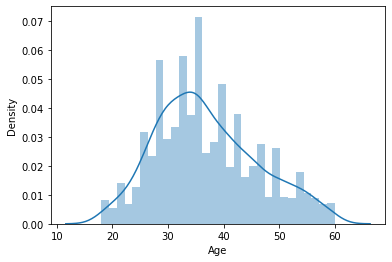

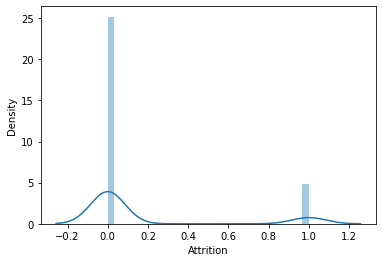

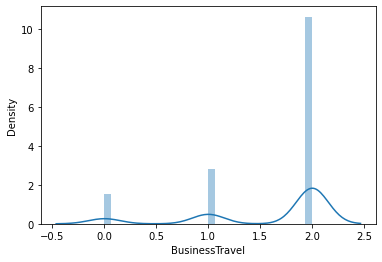

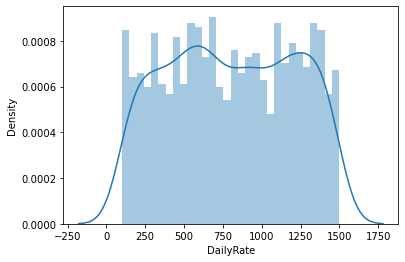

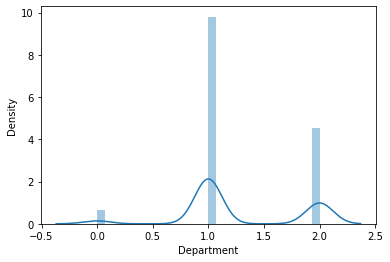

...

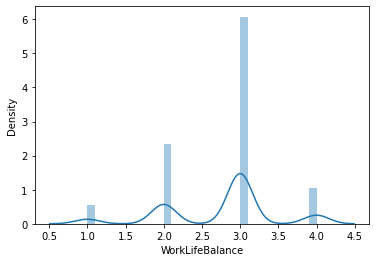

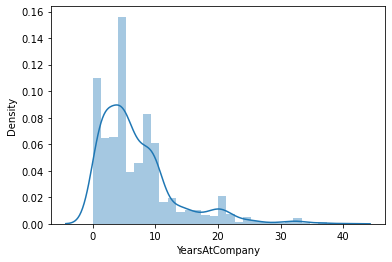

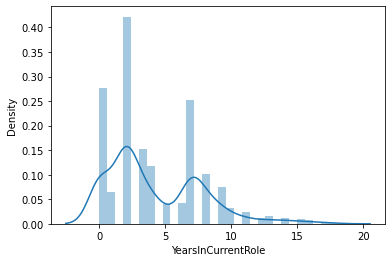

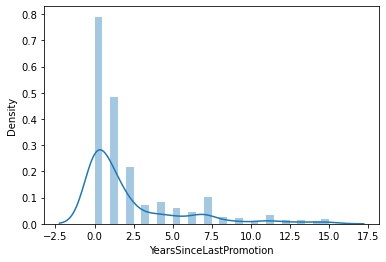

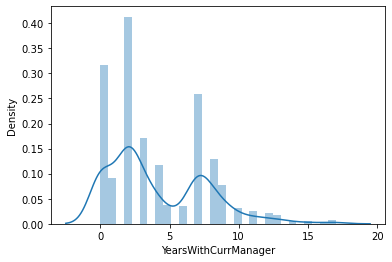

In [14]:
for i in df.columns: 
    sns.distplot(df[i],kde=True,bins=30)
    plt.show()

In [15]:
#data is not normally distributed, hence replacing null values with median
df['Attrition'] = df['Attrition'].fillna(value=df['Attrition'].median())

<AxesSubplot:xlabel='Attrition', ylabel='Density'>

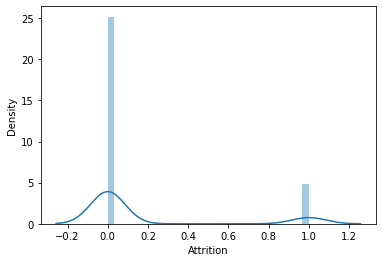

In [16]:
sns.distplot(df['Attrition'],kde=True,bins=30)

In [17]:
#Dropping the columns which are not required
df = df.drop(labels = 'BusinessTravel', axis = 1)

In [18]:
df = df.drop(labels = 'Education', axis = 1)

In [19]:
df = df.drop(labels = 'EmployeeNumber', axis = 1)

In [20]:
df = df.drop(labels = 'JobSatisfaction', axis = 1)

In [21]:
df = df.drop(labels = 'Over18', axis = 1)

In [22]:
df = df.drop(labels = 'StandardHours', axis = 1)

In [23]:
df = df.drop(labels = 'RelationshipSatisfaction', axis = 1)

In [24]:
df = df.drop(labels = 'TrainingTimesLastYear', axis = 1)

In [25]:
df = df.drop(labels = 'WorkLifeBalance', axis = 1)

In [26]:
df = df.drop(labels = 'EmployeeCount', axis = 1)

In [27]:
df.head()

,Age,Attrition,DailyRate,Department,DistanceFromHome,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,...,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,StockOptionLevel,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1102,2,1,1,2,0,94,3,...,8,1,11,3,0,8,6,4,0,5
1,49,0,279,1,8,1,3,1,61,2,...,1,0,23,4,1,10,10,7,1,7
2,37,1,1373,1,2,4,4,1,92,2,...,6,1,15,3,0,7,0,0,0,0
3,33,0,1392,1,3,1,4,0,56,3,...,1,1,11,3,0,8,8,7,3,0
4,27,0,591,1,2,3,1,1,40,3,...,9,0,12,3,1,6,2,2,2,2


In [28]:
df = df.rename(columns={'Attrition': 'target'})

In [29]:
df.head()

,Age,target,DailyRate,Department,DistanceFromHome,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,...,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,StockOptionLevel,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1102,2,1,1,2,0,94,3,...,8,1,11,3,0,8,6,4,0,5
1,49,0,279,1,8,1,3,1,61,2,...,1,0,23,4,1,10,10,7,1,7
2,37,1,1373,1,2,4,4,1,92,2,...,6,1,15,3,0,7,0,0,0,0
3,33,0,1392,1,3,1,4,0,56,3,...,1,1,11,3,0,8,8,7,3,0
4,27,0,591,1,2,3,1,1,40,3,...,9,0,12,3,1,6,2,2,2,2


In [30]:
profile = ProfileReport(df, title="Pandas Profiling Report")

In [40]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## check for outliers

In [31]:
#remove outliers before skewness check and before x, y split

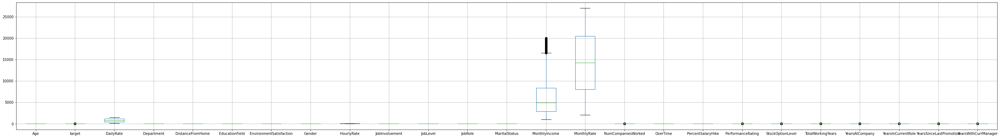

In [32]:
df.boxplot(figsize=[50,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

In [33]:
#Removing outliers by z score

In [34]:
from scipy.stats import zscore
z = np.abs(zscore(df))
new_df = df[(z<3).all(axis=1)]

In [35]:
new_df.shape

(1387, 25)

In [36]:
df.shape

(1470, 25)

In [37]:
dataloss = ((1470-1387)/1470)*100

In [38]:
dataloss

5.646258503401361

In [39]:
#Outliers are removed since data loss is less than 7%.

In [40]:
df= new_df

## check co-relation

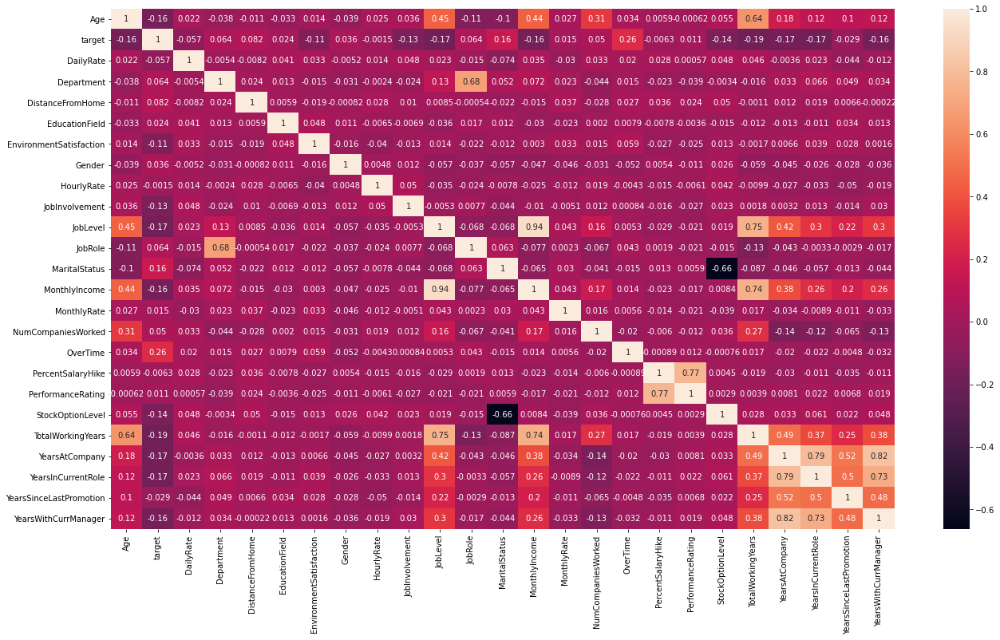

In [41]:
plt.figure(figsize=[22,12])
cor = df.corr()
sns.heatmap(cor, annot = True)
plt.show()

In [42]:
#Arrange co-relation in descending order. Dropping columns should be the last option to prevent data loss.

In [43]:
cor["target"].sort_values(ascending=False)

target                     1.000000
OverTime                   0.257237
MaritalStatus              0.160960
DistanceFromHome           0.081788
JobRole                    0.064283
Department                 0.063637
NumCompaniesWorked         0.050314
Gender                     0.036252
EducationField             0.023585
MonthlyRate                0.014888
PerformanceRating          0.010781
HourlyRate                -0.001532
PercentSalaryHike         -0.006267
YearsSinceLastPromotion   -0.029263
DailyRate                 -0.057220
EnvironmentSatisfaction   -0.112393
JobInvolvement            -0.133957
StockOptionLevel          -0.136676
Age                       -0.159366
MonthlyIncome             -0.161848
YearsWithCurrManager      -0.162297
YearsAtCompany            -0.166455
YearsInCurrentRole        -0.171015
JobLevel                  -0.171968
TotalWorkingYears         -0.185619
Name: target, dtype: float64

In [44]:
df.columns

Index(['Age', 'target', 'DailyRate', 'Department', 'DistanceFromHome',
       'EducationField', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel',
       'TotalWorkingYears', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [45]:
columns = ['Age', 'target', 'DailyRate', 'Department', 'DistanceFromHome',
       'EducationField', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel',
       'TotalWorkingYears', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager']

In [ ]:
sns.pairplot(df[columns])

## check for skewness

In [46]:
x = df.drop('target',axis=1)
y = df['target']

In [47]:
x.skew() # check skewness

Age                        0.472280
DailyRate                 -0.017078
Department                 0.183919
DistanceFromHome           0.954752
EducationField             0.544868
EnvironmentSatisfaction   -0.325285
Gender                    -0.417296
HourlyRate                -0.030481
JobInvolvement            -0.501401
JobLevel                   1.126075
JobRole                   -0.386843
MaritalStatus             -0.160952
MonthlyIncome              1.544770
MonthlyRate                0.030596
NumCompaniesWorked         1.037715
OverTime                   0.954751
PercentSalaryHike          0.800592
PerformanceRating          1.931566
StockOptionLevel           0.962332
TotalWorkingYears          1.034487
YearsAtCompany             1.248623
YearsInCurrentRole         0.726675
YearsSinceLastPromotion    1.756335
YearsWithCurrManager       0.694506
dtype: float64

In [48]:
from sklearn.preprocessing import power_transform
df_new = power_transform(x, method='yeo-johnson')

df_new = pd.DataFrame(df_new, columns = x.columns)

In [49]:
df_new.skew()

Age                       -0.004079
DailyRate                 -0.199742
Department                 0.015095
DistanceFromHome          -0.008149
EducationField            -0.008642
EnvironmentSatisfaction   -0.205472
Gender                    -0.417296
HourlyRate                -0.105678
JobInvolvement            -0.018801
JobLevel                   0.110769
JobRole                   -0.337641
MaritalStatus             -0.158253
MonthlyIncome              0.027700
MonthlyRate               -0.176560
NumCompaniesWorked         0.016175
OverTime                   0.954751
PercentSalaryHike          0.112128
PerformanceRating          0.000000
StockOptionLevel           0.089929
TotalWorkingYears         -0.009666
YearsAtCompany            -0.025230
YearsInCurrentRole        -0.069631
YearsSinceLastPromotion    0.212301
YearsWithCurrManager      -0.070570
dtype: float64

In [50]:
x.skew()

Age                        0.472280
DailyRate                 -0.017078
Department                 0.183919
DistanceFromHome           0.954752
EducationField             0.544868
EnvironmentSatisfaction   -0.325285
Gender                    -0.417296
HourlyRate                -0.030481
JobInvolvement            -0.501401
JobLevel                   1.126075
JobRole                   -0.386843
MaritalStatus             -0.160952
MonthlyIncome              1.544770
MonthlyRate                0.030596
NumCompaniesWorked         1.037715
OverTime                   0.954751
PercentSalaryHike          0.800592
PerformanceRating          1.931566
StockOptionLevel           0.962332
TotalWorkingYears          1.034487
YearsAtCompany             1.248623
YearsInCurrentRole         0.726675
YearsSinceLastPromotion    1.756335
YearsWithCurrManager       0.694506
dtype: float64

## find best random state

In [51]:
#for classification problems

In [52]:
from sklearn.linear_model import LogisticRegression
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=.30, random_state = i)
    LR = LogisticRegression()
    LR.fit(x_train, y_train)
    predLR = LR.predict(x_test)
    acc = accuracy_score(y_test, predLR)
    if acc>maxAccu:
        maxAccu = acc
        maxRS=i
print("Best accuracy is", maxAccu," on Random State ",maxRS)

Best accuracy is 0.8800959232613909  on Random State  30


In [53]:
#We have found the best random state as 30. We will create our train_test_split using this random state.

## test train split

In [54]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=30)

## handle data imbalance

<AxesSubplot:xlabel='target', ylabel='count'>

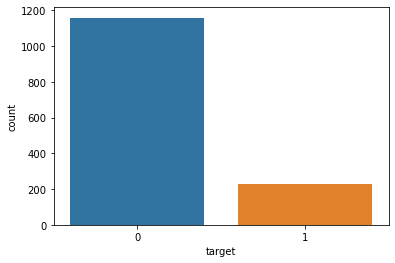

In [55]:
sns.countplot(df['target'])

In [56]:
y.value_counts()

0    1158
1     229
Name: target, dtype: int64

### classification 

In [57]:
#logistic_regression

In [58]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression()
LR.fit(x_train, y_train)
predlr = LR.predict(x_test)

print(accuracy_score(y_test,predlr))
print(confusion_matrix(y_test,predlr))
print(classification_report(y_test,predlr))

0.8800959232613909
[[361   2]
 [ 48   6]]
              precision    recall  f1-score   support

           0       0.88      0.99      0.94       363
           1       0.75      0.11      0.19        54

    accuracy                           0.88       417
   macro avg       0.82      0.55      0.56       417
weighted avg       0.87      0.88      0.84       417



In [59]:
#support vector machines

In [60]:
from sklearn.svm import SVC
svc = SVC()
svc.fit(x_train,y_train)
predsvc = svc.predict(x_test)

print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))

0.8705035971223022
[[363   0]
 [ 54   0]]
              precision    recall  f1-score   support

           0       0.87      1.00      0.93       363
           1       0.00      0.00      0.00        54

    accuracy                           0.87       417
   macro avg       0.44      0.50      0.47       417
weighted avg       0.76      0.87      0.81       417



In [61]:
#decisiontree

In [62]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(x_train,y_train)
preddt = dt.predict(x_test)

print(accuracy_score(y_test,preddt))
print(classification_report(y_test,preddt))
print(confusion_matrix(y_test,preddt))

0.8081534772182254
              precision    recall  f1-score   support

           0       0.90      0.87      0.89       363
           1       0.30      0.37      0.33        54

    accuracy                           0.81       417
   macro avg       0.60      0.62      0.61       417
weighted avg       0.83      0.81      0.82       417

[[317  46]
 [ 34  20]]


In [63]:
#random forest

In [64]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=1000)
rf.fit(x_train,y_train)
predrf = rf.predict(x_test)

print(accuracy_score(y_test,predrf))
print(classification_report(y_test,predrf))
print(confusion_matrix(y_test,predrf))

0.882494004796163
              precision    recall  f1-score   support

           0       0.89      0.98      0.94       363
           1       0.65      0.20      0.31        54

    accuracy                           0.88       417
   macro avg       0.77      0.59      0.62       417
weighted avg       0.86      0.88      0.85       417

[[357   6]
 [ 43  11]]


## check cross-validation scores

In [65]:
from sklearn.model_selection import cross_val_score

scr = cross_val_score(LR, x, y, cv=5)
print("CrossValidation Score of LogisticRegression Model: ", scr.mean())

CrossValidation Score of LogisticRegression Model:  0.8392203204945069


In [66]:
from sklearn.model_selection import cross_val_score

scr = cross_val_score(dt, x, y, cv=5)
print("CrossValidation Score of DecisionTree Model: ", scr.mean())

CrossValidation Score of DecisionTree Model:  0.7685842661610783


In [67]:
from sklearn.model_selection import cross_val_score

scr = cross_val_score(rf, x, y, cv=5)
print("CrossValidation Score of RandomForest Model: ", scr.mean())

CrossValidation Score of RandomForest Model:  0.8529127600446719


In [68]:
from sklearn.model_selection import cross_val_score

scr = cross_val_score(svc, x, y, cv=5)
print("CrossValidation Score of SVC Model: ", scr.mean())

CrossValidation Score of SVC Model:  0.8348959821312626


Model with least difference between Model accuracy and cross validation is selected as the best model

In [69]:
#LR -> 
88 - 83

5

In [70]:
# SVM -> 
87 - 83 

4

In [71]:
# DT -> 
80 - 76

4

In [72]:
# RF -> 
88  - 85 

3

## hyper parameter tuning

In [73]:
### Manual Hyperparameter Tuning
model=RandomForestClassifier(n_estimators=300,criterion='entropy',max_features='sqrt',min_samples_leaf=10,random_state=100).fit(x_train,y_train)
predictions=model.predict(x_test)
print(confusion_matrix(y_test,predictions))
print(accuracy_score(y_test,predictions))
print(classification_report(y_test,predictions))

[[361   2]
 [ 46   8]]
0.8848920863309353
              precision    recall  f1-score   support

           0       0.89      0.99      0.94       363
           1       0.80      0.15      0.25        54

    accuracy                           0.88       417
   macro avg       0.84      0.57      0.59       417
weighted avg       0.88      0.88      0.85       417



In [83]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [96]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(x_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=100, verbose=2)

In [97]:
rf_randomcv.best_params_

{'n_estimators': 1200,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'max_features': 'sqrt',
 'max_depth': 1000,
 'criterion': 'gini'}

In [98]:
rf_randomcv

RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=100, verbose=2)

In [99]:
best_random_grid=rf_randomcv.best_estimator_

In [100]:
from sklearn.metrics import accuracy_score
y_pred=best_random_grid.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[360   3]
 [ 45   9]]
Accuracy Score 0.8848920863309353
Classification report:               precision    recall  f1-score   support

           0       0.89      0.99      0.94       363
           1       0.75      0.17      0.27        54

    accuracy                           0.88       417
   macro avg       0.82      0.58      0.61       417
weighted avg       0.87      0.88      0.85       417



## Grid Search CV

In [101]:
rf_randomcv.best_params_

{'n_estimators': 1200,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'max_features': 'sqrt',
 'max_depth': 1000,
 'criterion': 'gini'}

In [102]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)

{'criterion': ['gini'], 'max_depth': [1000], 'max_features': ['sqrt'], 'min_samples_leaf': [4, 6, 8], 'min_samples_split': [3, 4, 5, 6, 7], 'n_estimators': [1000, 1100, 1200, 1300, 1400]}


In [ ]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(x_train,y_train)

In [ ]:
grid_search.best_estimator_

In [ ]:
best_grid=grid_search.best_estimator_

In [ ]:
best_grid

In [ ]:
y_pred=best_grid.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

## saving the model

In [ ]:
import joblib
joblib.dump(best_grid, "model.pkl") #rename as per project name
prediction = model.predict(x_test)

## loading the saved model

In [ ]:
model = joblib.load("model.pkl")

In [ ]:
prediction = model.predict(x_test)

In [ ]:
print(accuracy_score(y_test,prediction)*100)

In [ ]:
prediction = pd.DataFrame(prediction) # converting into dataframe

In [ ]:
prediction.to_csv("Results.csv")